# Example 4

This notebook generates events inside the MicroBooNE cryostat.

In [1]:
%load_ext autoreload
%autoreload 2

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import DarkNews as dn
from DarkNews import GenLauncher

import ToyAnalysis as ta

import ToyAnalysis.analysis as a
import ToyAnalysis.analysis_decay as an

#### We start by generating events for four benchmark points inside the MicroBooNE cryostat. 

In [5]:
kwargs = {  
        'neval': 1e5,
        'HNLtype': 'dirac',
        'hepevt': True,
        'unweighed_hep_events': 1000,
        'hep_unweigh': True,
        'experiment': 'microboone',
        'nopelastic': True,
        'pandas': False,
        'loglevel': 'WARNING'
        }

gen_object = GenLauncher(mzprime=0.030, m4=0.150, **kwargs)
gen_object.run()
df1 = gen_object.df

gen_object = GenLauncher(mzprime=1.25, m4=0.150, **kwargs)
gen_object.run()
df2 = gen_object.df

gen_object = GenLauncher(mzprime=0.03, m5=0.150, m4=0.107, **kwargs)
gen_object.run()
df3 = gen_object.df

gen_object = GenLauncher(mzprime=1.25, m5=0.150, m4=0.107, **kwargs)
gen_object.run()
df4 = gen_object.df

Unweighted events requested. This feature requires a large number of weighted events with respect to the requested number of hep-formatted events. Currently: n_unweighed/n_eval = 1.0%.
Unweighted events requested. This feature requires a large number of weighted events with respect to the requested number of hep-formatted events. Currently: n_unweighed/n_eval = 1.0%.
Unweighted events requested. This feature requires a large number of weighted events with respect to the requested number of hep-formatted events. Currently: n_unweighed/n_eval = 1.0%.
Unweighted events requested. This feature requires a large number of weighted events with respect to the requested number of hep-formatted events. Currently: n_unweighed/n_eval = 1.0%.


In [6]:
# we get crazy numbers because we didn't set the couplings to reasonable values

print(f"Total upscattering events for BP1 {df1['w_event_rate'].sum():.2E}")
print(f"Total upscattering events for BP2 {df2['w_event_rate'].sum():.2E}")
print(f"Total upscattering events for BP3 {df3['w_event_rate'].sum():.2E}")
print(f"Total upscattering events for BP4 {df4['w_event_rate'].sum():.2E}")

Total upscattering events for BP1 6.07E+03
Total upscattering events for BP2 3.80E-02
Total upscattering events for BP3 6.07E+03
Total upscattering events for BP4 3.47E-02


In [8]:
# we set some useful parameters and compute which events occur in the active detector of MicroBooNE

df1 = an.set_params(df1)
df2 = an.set_params(df2)
df3 = an.set_params(df3)
df4 = an.set_params(df4)

df1_decay = an.select_muB_decay(df1)
df2_decay = an.select_muB_decay(df2)
df3_decay = an.select_muB_decay(df3)
df4_decay = an.select_muB_decay(df4)

#### Looking at the geometry of the scattering positions: XY plane

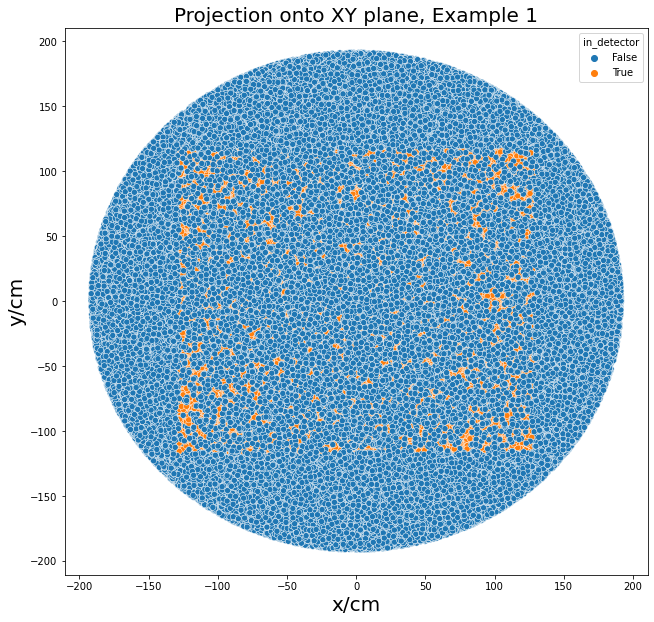

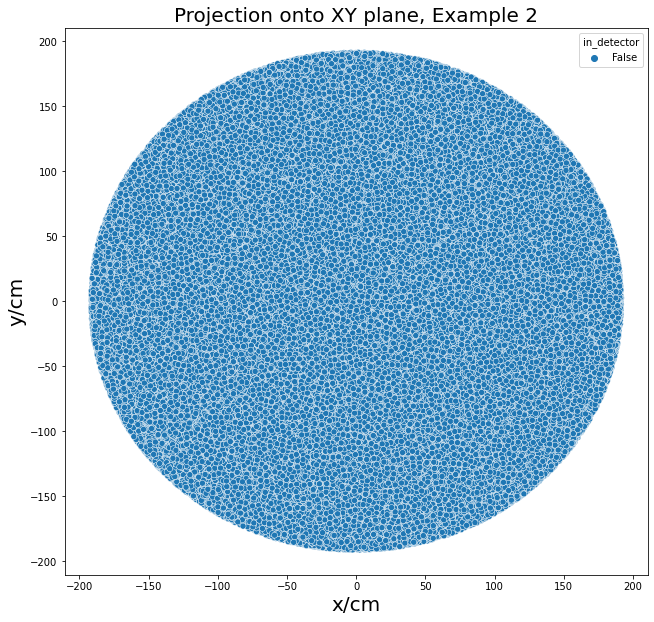

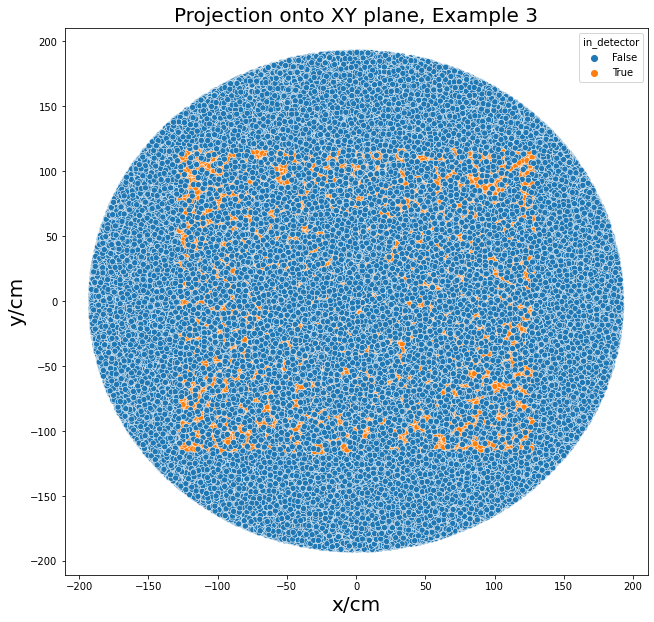

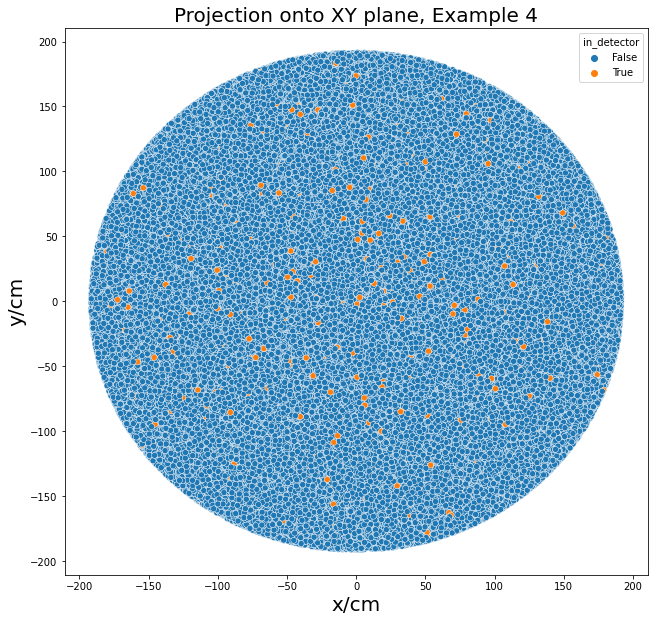

In [17]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Projection onto XY plane, Example " + bp
    xlabel = r'x/cm'
    ylabel = r'y/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(data=df_scat,x="scatt_x",y="scatt_y",hue="in_detector")
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)

#### Looking at the geometry of the scattering positions: YZ plane

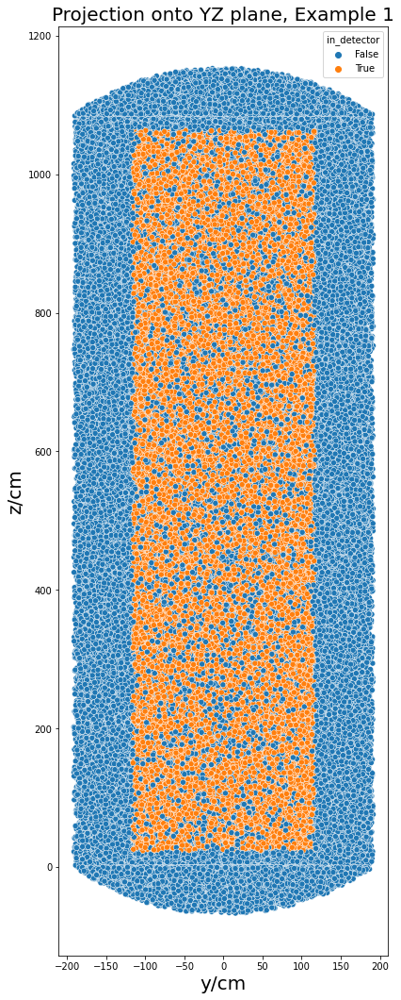

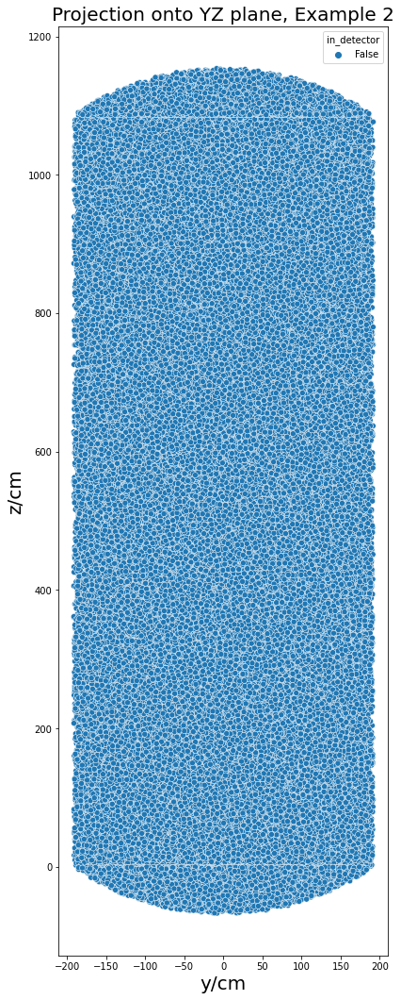

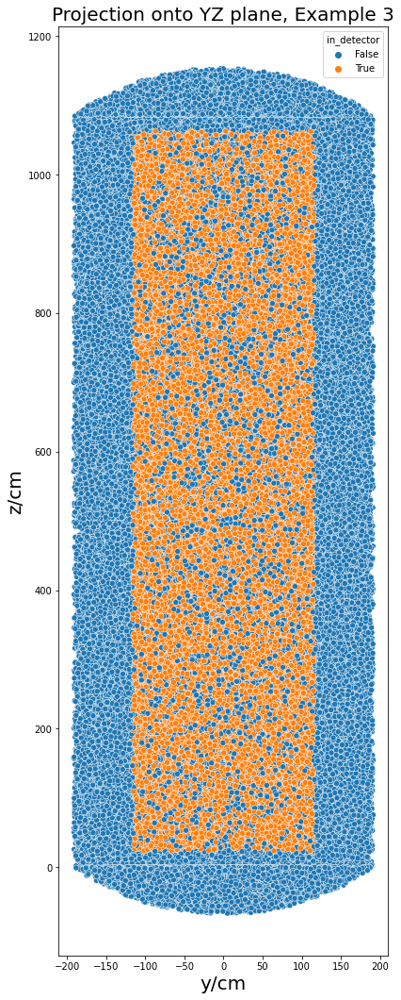

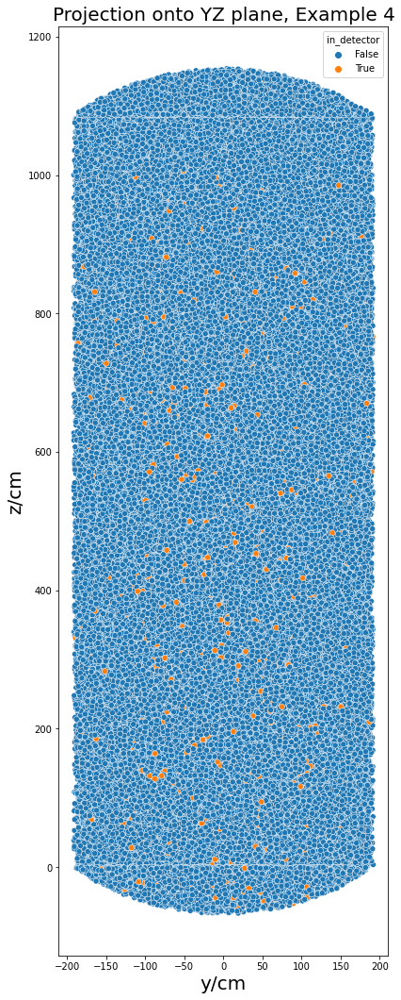

In [20]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Projection onto YZ plane, Example " + bp
    xlabel = r'y/cm'
    ylabel = r'z/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(6,18))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(data=df_scat,x="scatt_y",y="scatt_z",hue="in_detector")
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)

# Decay position

Considering points with a short and very long lifetimes.

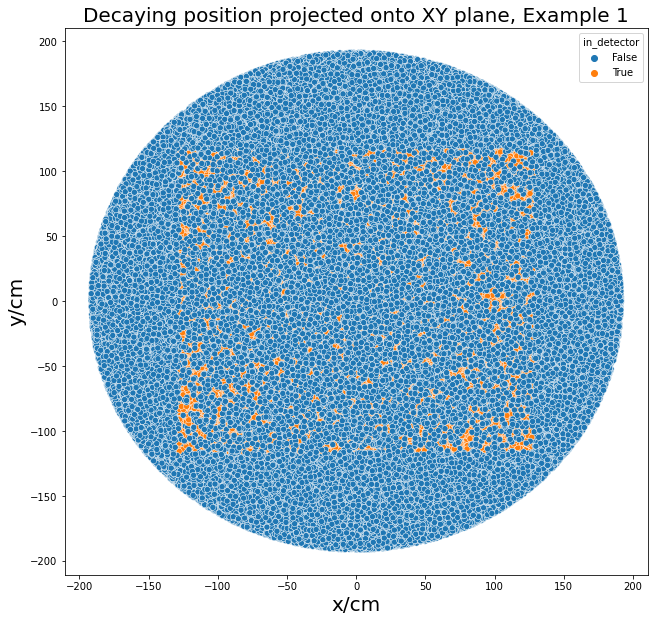

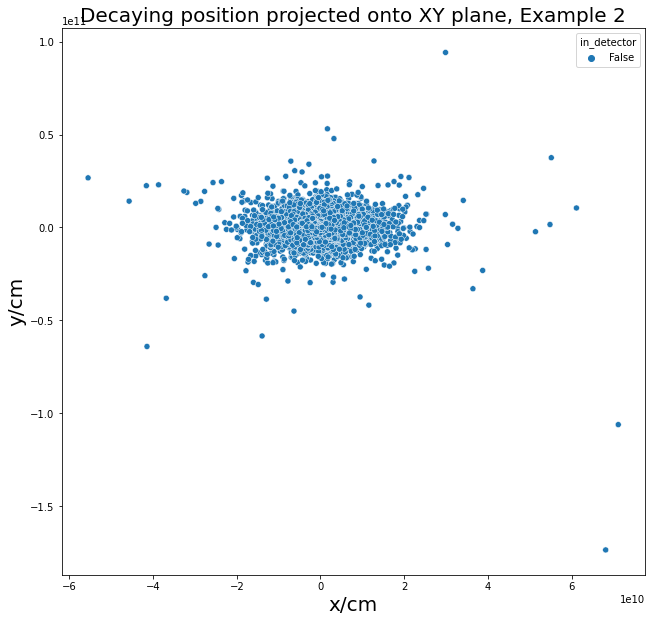

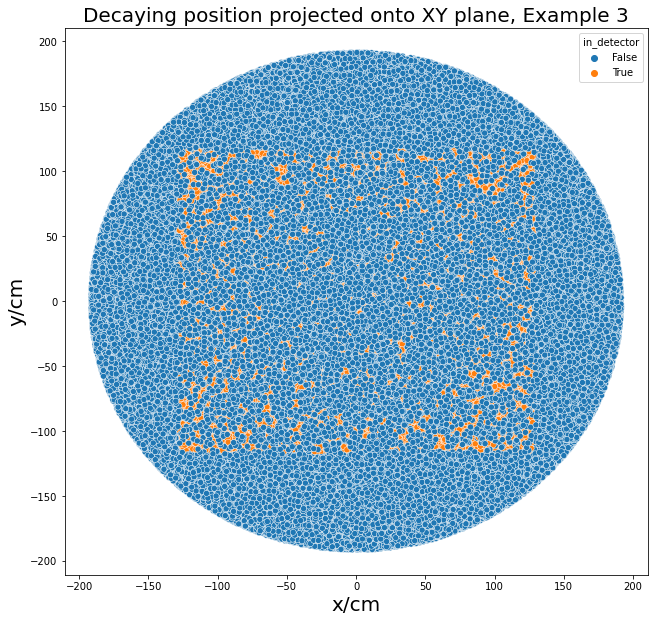

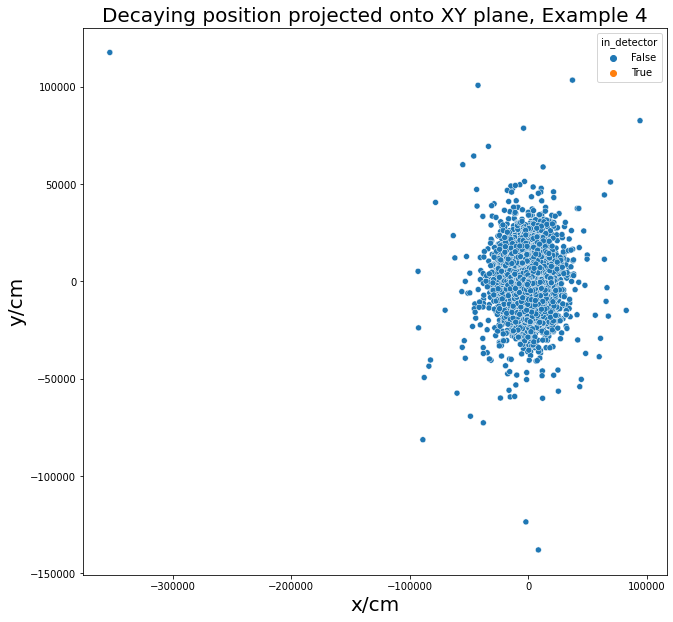

In [18]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Decaying position projected onto XY plane, Example "+bp
    xlabel = r'x/cm'
    ylabel = r'y/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(data=df_scat,x="decay_position_x",y="decay_position_y",hue="in_detector")
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)

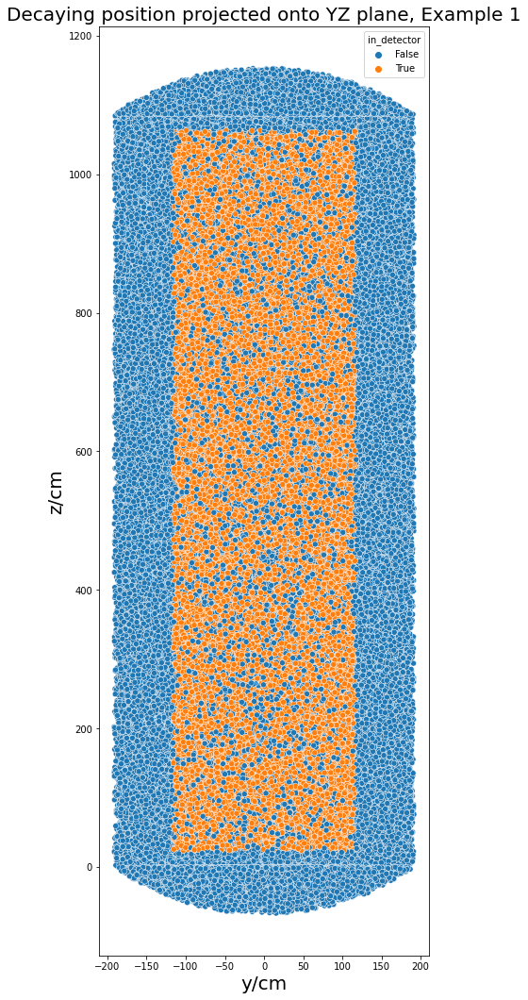

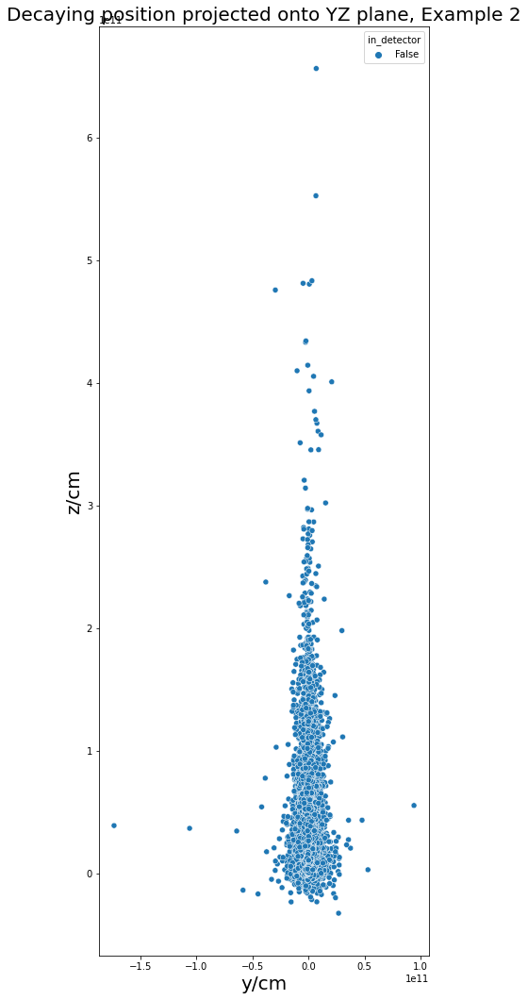

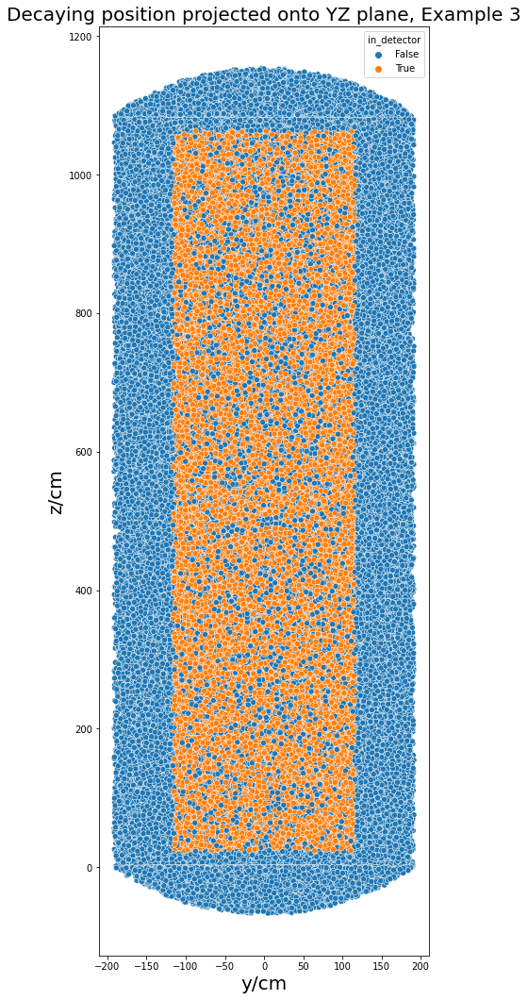

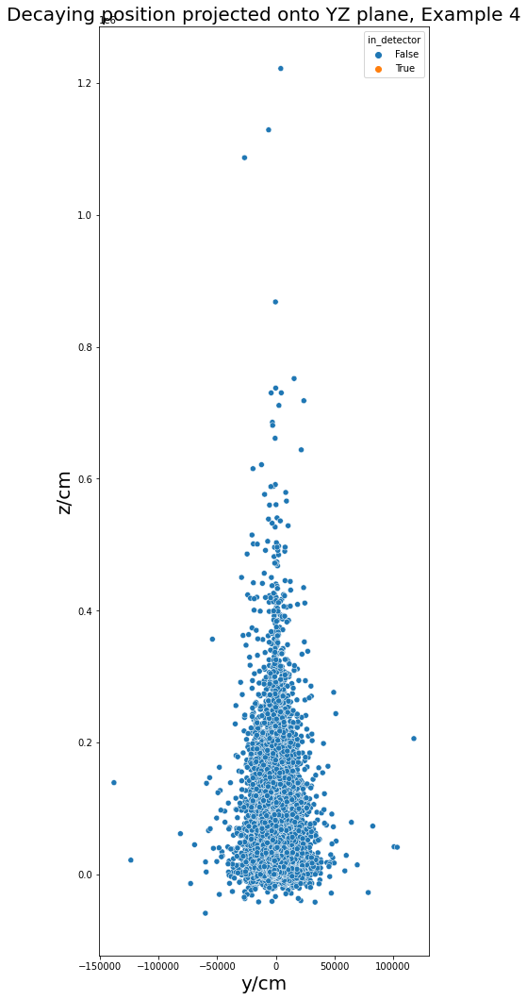

In [21]:
bp_list = ['1','2','3','4']
df_list = [df1_decay,df2_decay,df3_decay,df4_decay]

for case in range(4):
    bp = bp_list[case]
    df_scat = df_list[case].copy(deep=True)
    title = r"Decaying position projected onto YZ plane, Example "+bp
    xlabel = r'y/cm'
    ylabel = r'z/cm'
    
    axes_form  =[0.16,0.16,0.81,0.76]
    fig = plt.figure(figsize=(6,18))
    ax = fig.add_axes(axes_form, rasterized=False)
    ax.patch.set_alpha(0.0)
    sns.scatterplot(data=df_scat,x="decay_position_y",y="decay_position_z",hue="in_detector")
    ax.set_title(title,fontsize=20)
    ax.set_xlabel(xlabel,fontsize=20)
    ax.set_ylabel(ylabel,fontsize=20)